In [1]:
import xarray as xr
from pathlib import Path
from xhistogram.xarray import histogram as xhist
import numpy as np
import pandas as pd

In [2]:
from dask.distributed import Client
client = Client(n_workers=2, threads_per_worker=3, memory_limit=15e9)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 2
Total threads: 6,Total memory: 27.94 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:33577,Workers: 0
Dashboard: http://127.0.0.1:8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:40633,Total threads: 3
Dashboard: http://127.0.0.1:33833/status,Memory: 13.97 GiB
Nanny: tcp://127.0.0.1:38277,


In [3]:
stores1 = sorted(Path("/work/bk1450/b383184/Amazon/Atlantic/data/tracks_4567").glob("Parcels_run_*_*.zarr"))
stores2  = sorted(Path("/work/bk1450/b383184/Amazon/Atlantic/data/tracks_3456").glob("Parcels_run_*_*.zarr"))
stores3 = sorted(Path("/work/bk1450/b383184/Amazon/Atlantic/data/tracks_2345").glob("Parcels_run_*_*.zarr"))

stores = stores1+stores2+stores3
stores[:3]

[PosixPath('/work/bk1450/b383184/Amazon/Atlantic/data/tracks_4567/Parcels_run_4567_2022-06-05.zarr'),
 PosixPath('/work/bk1450/b383184/Amazon/Atlantic/data/tracks_4567/Parcels_run_4567_2022-06-10.zarr'),
 PosixPath('/work/bk1450/b383184/Amazon/Atlantic/data/tracks_4567/Parcels_run_4567_2022-06-15.zarr')]

In [4]:
ds_list = [xr.open_zarr(s) for s in stores]
ds = xr.concat(ds_list,dim='trajectory')

ds = ds.drop_vars(['z','age','sal','temp'])
ds

/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/dask/array/core.py:4998: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/dask/array/core.py:4998: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/dask/array/core.py:4998: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


<xarray.Dataset> Size: 91GB
Dimensions:     (trajectory: 6160000, obs: 925)
Coordinates:
  * obs         (obs) int32 4kB 0 1 2 3 4 5 6 7 ... 918 919 920 921 922 923 924
  * trajectory  (trajectory) int64 49MB 0 1 2 3 4 5 ... 9995 9996 9997 9998 9999
Data variables:
    lat         (trajectory, obs) float32 23GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
    lon         (trajectory, obs) float32 23GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
    time        (trajectory, obs) datetime64[ns] 46GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
Attributes:
    Conventions:            CF-1.6/CF-1.7
    feature_type:           trajectory
    ncei_template_version:  NCEI_NetCDF_Trajectory_Template_v2.0
    parcels_kernels:        JITParticleAdvectionRK4_3DCheckError
    parcels_mesh:           spherical
    parcels_version:        3.1.2

In [5]:
num_valid_obs_steps = int(ds.lat.notnull().any('trajectory').sum().compute().data[()])
ds = ds.isel(obs=slice(None, num_valid_obs_steps))
ds

<xarray.Dataset> Size: 73GB
Dimensions:     (trajectory: 6160000, obs: 741)
Coordinates:
  * obs         (obs) int32 3kB 0 1 2 3 4 5 6 7 ... 734 735 736 737 738 739 740
  * trajectory  (trajectory) int64 49MB 0 1 2 3 4 5 ... 9995 9996 9997 9998 9999
Data variables:
    lat         (trajectory, obs) float32 18GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
    lon         (trajectory, obs) float32 18GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
    time        (trajectory, obs) datetime64[ns] 37GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
Attributes:
    Conventions:            CF-1.6/CF-1.7
    feature_type:           trajectory
    ncei_template_version:  NCEI_NetCDF_Trajectory_Template_v2.0
    parcels_kernels:        JITParticleAdvectionRK4_3DCheckError
    parcels_mesh:           spherical
    parcels_version:        3.1.2

In [6]:
ds = ds.assign(start_time=ds.time.isel(obs=0).compute())

/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/coding/times.py:650: RuntimeWarning: invalid value encountered in cast
  flat_num = flat_num.astype(np.int64)


In [7]:
lat_min=ds.lat.min().compute().data[()]
lon_min=ds.lon.min().compute().data[()]

lat_max=ds.lat.max().compute().data[()]
lon_max=ds.lon.max().compute().data[()]

## Histogram calculation 5 daily

In [8]:
lat_bins = np.linspace(lat_min, lat_max, 30)
lon_bins = np.linspace(lon_min, lon_max, 30)

In [9]:
def calc_hist(ds):
    return xhist(
        ds.lon,
        ds.lat,
        bins=[lon_bins, lat_bins],
        dim=["trajectory", ],
        bin_dim_suffix=""
    )

In [10]:
# calc hist for each start year / start month
hist = ds.groupby(["start_time"]).apply(calc_hist)

# aggregate obs into 5 day bins (with 4 steps each day), skipping the initial positions
hist = hist.isel(obs=slice(1, None)).coarsen(obs=4 * 5, boundary="trim").sum()

# compute and store to file
# hist.drop_encoding().compute().to_netcdf("_hist_AT_congress.nc")

/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/distributed/client.py:3363: UserWarning: Sending large graph of size 36.01 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


## Histogram calculation monthly

In [12]:
ds = ds.assign(start_season=ds.start_time.dt.season)
ds

<xarray.Dataset> Size: 73GB
Dimensions:       (trajectory: 6160000, obs: 741)
Coordinates:
  * obs           (obs) int32 3kB 0 1 2 3 4 5 6 ... 734 735 736 737 738 739 740
  * trajectory    (trajectory) int64 49MB 0 1 2 3 4 ... 9995 9996 9997 9998 9999
Data variables:
    lat           (trajectory, obs) float32 18GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
    lon           (trajectory, obs) float32 18GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
    time          (trajectory, obs) datetime64[ns] 37GB dask.array<chunksize=(10000, 20), meta=np.ndarray>
    start_time    (trajectory) datetime64[ns] 49MB 2022-06-05 ... 2025-06-05
    start_year    (trajectory) <U3 74MB 'JJA' 'JJA' 'JJA' ... 'JJA' 'JJA' 'JJA'
    start_season  (trajectory) <U3 74MB 'JJA' 'JJA' 'JJA' ... 'JJA' 'JJA' 'JJA'
Attributes:
    Conventions:            CF-1.6/CF-1.7
    feature_type:           trajectory
    ncei_template_version:  NCEI_NetCDF_Trajectory_Template_v2.0
    parcels_kernels:        JITParticleAdvectionRK4_3DCheckError
    parcels_mesh:           spherical
    parcels_version:        3.1.2

In [14]:
hist_season = ds.groupby(["start_season"]).apply(calc_hist)

# aggregate obs into 5 day bins (with 4 steps each day), skipping the initial positions
hist_season = hist_season.isel(obs=slice(1, None)).coarsen(obs=4 * 5, boundary="trim").sum()

# compute and store to file
hist_season.drop_encoding().compute().to_netcdf("_hist_Season_congress.nc")

/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/distributed/client.py:3363: UserWarning: Sending large graph of size 19.45 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


## Plots

### Seasonality

In [2]:
hist_season = xr.open_dataset("_hist_Season_congress.nc").compute().histogram_lon_lat
hist_season

<xarray.DataArray 'histogram_lon_lat' (start_season: 4, obs: 37, lon: 29,
                                       lat: 29)> Size: 996kB
array([[[[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
...
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 0,  0,  0, ...,  9,  0,  0],
         [ 0,  0,  0, ...,  7,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]]]], shape=(4, 37, 29, 29))
Coordinates:
  * obs           (obs) float64 296B 10.5 30.5 50.5 70.5 ... 690.5 710.5 730.5
  * lon           (lon) float32 116B -88.2 -85.11 -82.01 ... -4.642 -1.548
  * lat           (lat) float32 116B -5.423 -4.183 -2.943 ... 26.82 28.06 29.3
  * start_season  (start_season) <U3 48B 'DJF' 'JJA' 'MAM' 'SON'

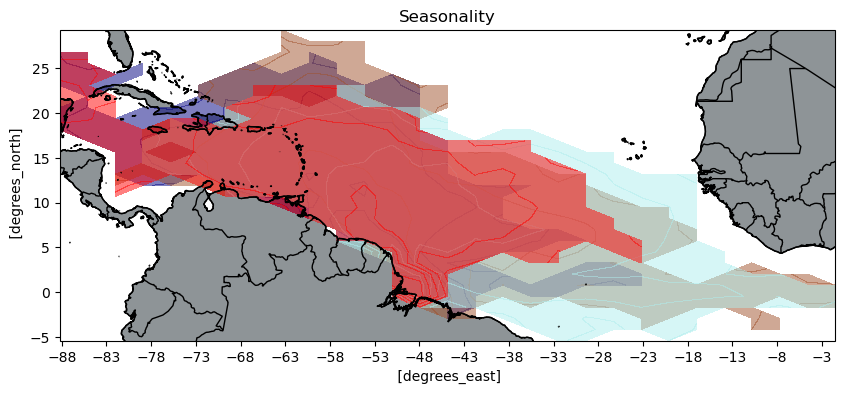

In [50]:
import matplotlib as mpl
import cartopy.feature as cf

alpha = 0.5  # 0..1

# navy = (0/255, 0/255, 128/255, alpha)  # RGBA for navy
# sienna = (*mpl.colors.to_rgb('#a0522d'), alpha)
# paleturq = (*mpl.colors.to_rgb('#afeeee'), alpha)
# rdm_color = (*mpl.colors.to_rgb('#ff0000'), alpha)

# bluenavy_ = mpl.colors.ListedColormap([navy])
# sienna_ = mpl.colors.ListedColormap([sienna])
# paleturq_ = mpl.colors.ListedColormap([paleturq])
# rdm_ = mpl.colors.ListedColormap([rdm_color])

data0 = hist_season.sel(start_season='DJF').sum("obs")
data1 = hist_season.sel(start_season='MAM').sum("obs")
data2 = hist_season.sel(start_season='JJA').sum("obs")
data3 = hist_season.sel(start_season='SON').sum("obs")


##plot
# fig,ax = plt.axes(projection=cartopy.crs.PlateCarree(),figsize=(7,14))

fig, ax = plt.subplots(1, 1, figsize=(10,20), subplot_kw=dict(projection=cartopy.crs.PlateCarree()))

np.log10(data0).plot.contourf(
                x="lon", y="lat",
                transform=cartopy.crs.PlateCarree(), ax=ax,
                add_colorbar=False,colors='#000080',alpha = 0.5,
            )

np.log10(data1).plot.contourf(
                x="lon", y="lat",
                transform=cartopy.crs.PlateCarree(), ax=ax,
                add_colorbar=False,colors='#a0522d',alpha = 0.5
            )

np.log10(data2).plot.contourf(
                x="lon", y="lat",
                transform=cartopy.crs.PlateCarree(), ax=ax,
                add_colorbar=False,colors='#afeeee',alpha = 0.5
            )

np.log10(data3).plot.contourf(
                x="lon", y="lat",
                transform=cartopy.crs.PlateCarree(), ax=ax,
                add_colorbar=False,colors='#ff0000',alpha = 0.5
            )

ax.coastlines()
ax.set_title('Seasonality')
ax.coastlines(resolution='10m')
ax.add_feature(cf.BORDERS)
ax.add_feature(cf.LAND, facecolor='#8e9497ff')

ax.set_xticks(np.arange(np.round(hist_season.lon.min().data),np.round(hist_season.lon.max().data),5))
ax.set_yticks(np.arange(np.round(hist_season.lat.min().data),np.round(hist_season.lat.max().data),5))

ax.set_xticklabels(['88°W','83°W','78°W','68°W','63°W','2°W','0°','2°E',
                    '4°E','6°E','8°E','10°E'],fontsize=14)

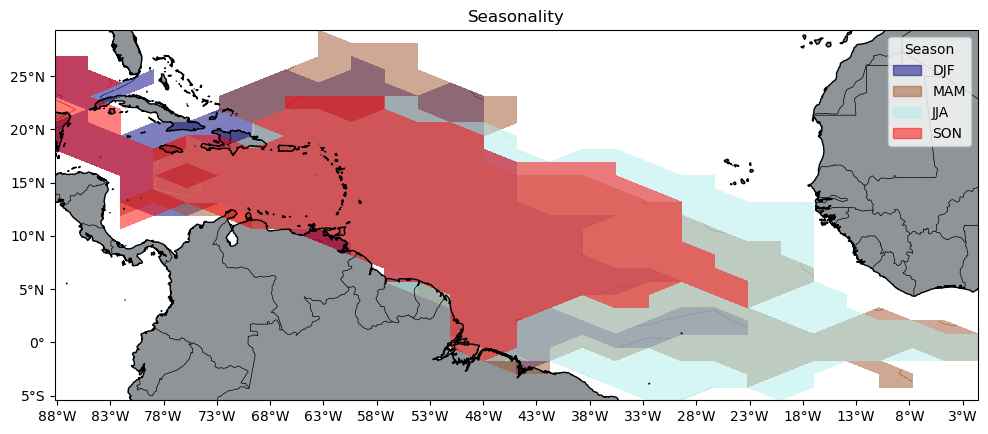

In [59]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cf
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.patches as mpatches

labels_colors = [
    ('DJF', '#000080'),
    ('MAM', '#a0522d'),
    ('JJA', '#afeeee'),
    ('SON', '#ff0000'),
]

def log10_safe(da):
    return da.where(da > 0).pipe(np.log10)

fig, ax = plt.subplots(1, 1, figsize=(10, 20),
                       subplot_kw=dict(projection=ccrs.PlateCarree()))

# Plot layers
layers = [
    (data0, '#000080', 'DJF'),
    (data1, '#a0522d', 'MAM'),
    (data2, '#afeeee', 'JJA'),
    (data3, '#ff0000', 'SON'),
]
for da, color, _ in layers:
    log10_safe(da).plot.contourf(
        x='lon', y='lat', ax=ax, transform=ccrs.PlateCarree(),
        add_colorbar=False, colors=[color], alpha=0.5, levels = [1,hist_season.max()]
    )

# Map cosmetics
ax.set_title('Seasonality')
ax.coastlines(resolution='10m')
ax.add_feature(cf.BORDERS, linewidth=0.5)
ax.add_feature(cf.LAND, facecolor='#8e9497ff', zorder=0)

# Ticks + formatters
lon_ticks = np.arange(np.round(hist_season.lon.min().item()),
                      np.round(hist_season.lon.max().item()) + 1e-6, 5)
lat_ticks = np.arange(np.round(hist_season.lat.min().item()),
                      np.round(hist_season.lat.max().item()) + 1e-6, 5)
ax.set_xticks(lon_ticks, crs=ccrs.PlateCarree())
ax.set_yticks(lat_ticks, crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(LongitudeFormatter(number_format='.0f', degree_symbol='°'))
ax.yaxis.set_major_formatter(LatitudeFormatter(number_format='.0f', degree_symbol='°'))
ax.set_xlabel('')
ax.set_ylabel('')

# Legend (proxy patches)
handles = [mpatches.Patch(color=c, alpha=0.5, label=lab) for _, c, lab in layers]
ax.legend(handles=handles, title='Season', loc='upper right', frameon=True)

plt.tight_layout()
# plt.savefig("seasonality.png", dpi=300, bbox_inches="tight")
plt.show()


/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/tmp/ipykernel_894199/2072234634.py:29: UserWarning: This figure includes Axes that are not compatible with tight_layout, so

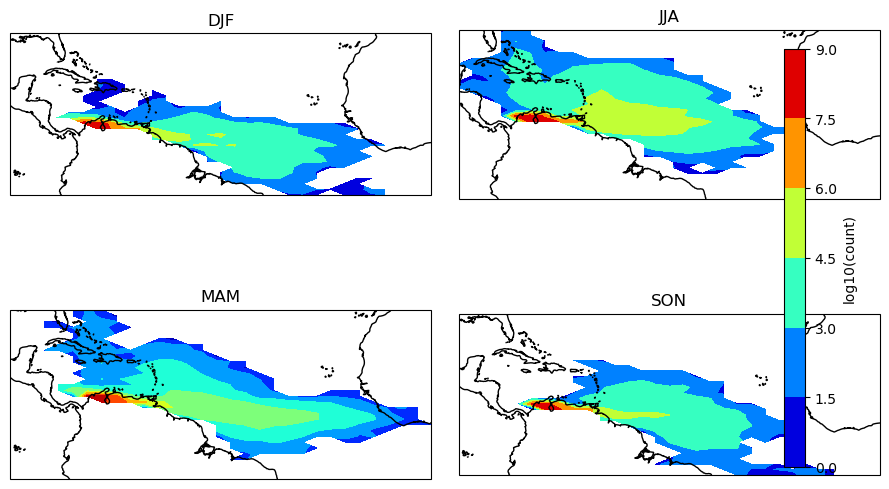

In [20]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np

seasons = np.unique(hist_season.start_season)[:4]  # ensure 4 panels
fig, axes = plt.subplots(2, 2, figsize=(9, 7),
                         subplot_kw=dict(projection=ccrs.PlateCarree()))
axes = axes.ravel()

np.seterr(divide='ignore', invalid='ignore')

for i, s in enumerate(seasons):
    ax = axes[i]
    data = hist_season.sel(start_season=s).sum("obs")
    dlog = np.where(data > 0, np.log10(data), np.nan)  # avoid log10(0)
    im = ax.contourf(data.lon, data.lat, dlog, transform=ccrs.PlateCarree(),
                       cmap='jet', shading='auto')
    ax.set_title(str(s))
    ax.coastlines()

# remove unused axes if fewer than 4
for j in range(len(seasons), 4):
    fig.delaxes(axes[j])

# shared colorbar
cbar = fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.03, pad=0.16)
cbar.set_label('log10(count)')

fig.tight_layout()

/tmp/ipykernel_894199/1829278572.py:9: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=0.1)
/tmp/ipykernel_894199/1829278572.py:43: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


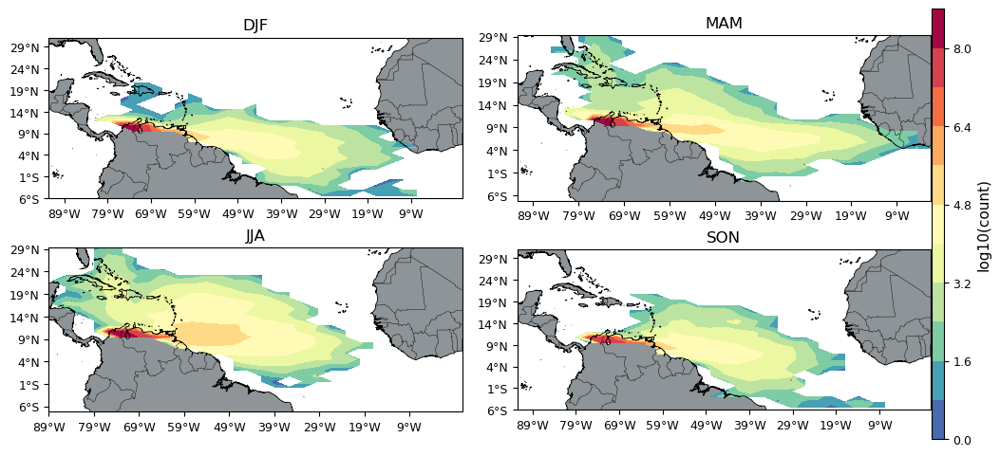

In [94]:
seasons = ['DJF','MAM','JJA','SON']  # explicit order
fig, axes = plt.subplots(
    2, 2, figsize=(10, 7),
    subplot_kw=dict(projection=ccrs.PlateCarree()),
    constrained_layout=True
)
axes = axes.ravel()

fig.tight_layout(pad=0.1)
fig.subplots_adjust(wspace=0.1, hspace=-0.5)

def log10_safe(da): 
    return da.where(da > 0).pipe(np.log10)

dlogs = [log10_safe(hist_season.sel(start_season=s).sum('obs')) for s in seasons]
vmin = min(float(np.nanmin(d.values)) for d in dlogs)
vmax = max(float(np.nanmax(d.values)) for d in dlogs)
cmap = 'Spectral_r'

for ax, s, dlog in zip(axes, seasons, dlogs):
    im = ax.contourf(
        dlog.lon, dlog.lat, dlog,
        levels=10, vmin=vmin, vmax=vmax,
        cmap=cmap, transform=ccrs.PlateCarree()
    )
    ax.set_title(s, fontsize=12)
    ax.coastlines(resolution='10m', linewidth=0.6)
    ax.add_feature(cf.BORDERS, linewidth=0.3)
    # ax.add_feature(cf.LAND, facecolor='#e8e8e8', zorder=0)
    ax.add_feature(cf.LAND, facecolor='#8e9497ff', zorder=0)

    ax.set_xticks(np.arange(np.floor(dlog.lon.min()), np.ceil(dlog.lon.max())+1e-6, 10), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(np.floor(dlog.lat.min()), np.ceil(dlog.lat.max())+1e-6, 5), crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(LongitudeFormatter(number_format='.0f', degree_symbol='°'))
    ax.yaxis.set_major_formatter(LatitudeFormatter(number_format='.0f', degree_symbol='°'))
    ax.tick_params(labelsize=9)

# shared colorbar (vertical)
cbar = fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.013, pad=0.01, aspect=35)
cbar.set_label('log10(count)', fontsize=11)
cbar.ax.tick_params(labelsize=9)

plt.tight_layout()
# plt.savefig("seasonality_subplots.png", dpi=300, bbox_inches="tight")
plt.show()

### Hist Mesoescale

In [96]:
hist_5 = xr.open_dataset("_hist_AT_congress.nc").compute().histogram_lon_lat
print(hist_5)

<xarray.DataArray 'histogram_lon_lat' (start_time: 260, obs: 37, lon: 29,
                                       lat: 29)> Size: 65MB
array([[[[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],

        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],

        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
...
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],

        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
    

In [99]:
hist_5.isel(start_time=0)

<xarray.DataArray 'histogram_lon_lat' (obs: 37, lon: 29, lat: 29)> Size: 249kB
array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
...
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]], shape=(37, 29, 29))
Coordinates:
  * obs         (obs) float64 296B 10.5 30.5 50.5 70.5 ... 690.5 710.5 730.5
  * lon         (lon) float32 116B -88.2 -85.11 -82.01 ... -7.737 -4.642 -1.548
  * lat         (lat) float32 116B -5.423 -4.183 -2.943 ... 26.82 28.06 29.3
    start_time  datetime64[ns] 8B 2022-06-05

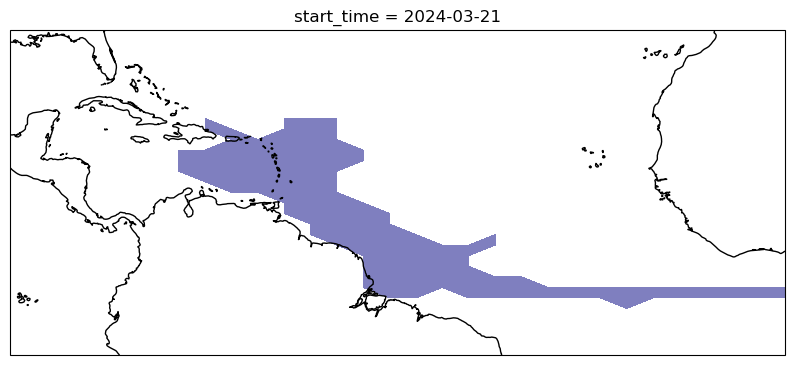

In [128]:
dat = hist_5.isel(start_time=132).sum("obs")

fig, ax = plt.subplots(1, 1, figsize=(10,20), subplot_kw=dict(projection=cartopy.crs.PlateCarree()))
np.log10(dat).plot.contourf(
                x="lon", y="lat",
                transform=cartopy.crs.PlateCarree(), ax=ax,
                add_colorbar=False,colors='#000080',alpha = 0.5, levels=[0,hist_5.max()]
            )
ax.coastlines()

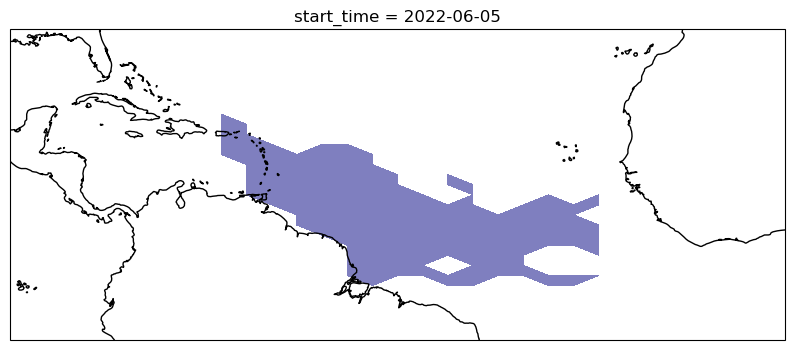

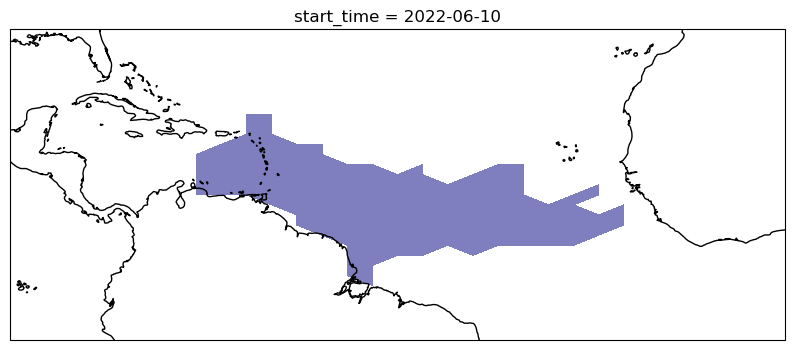

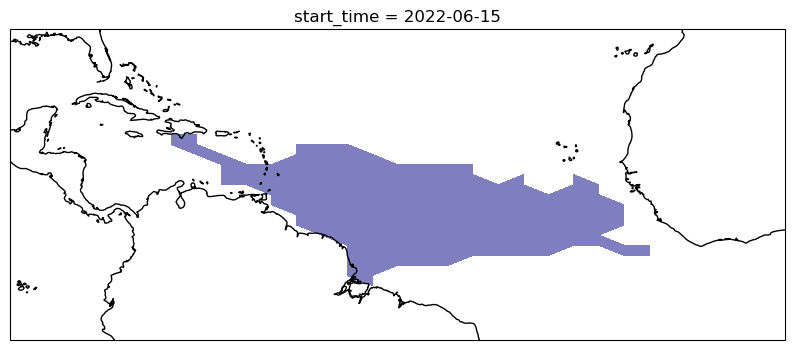

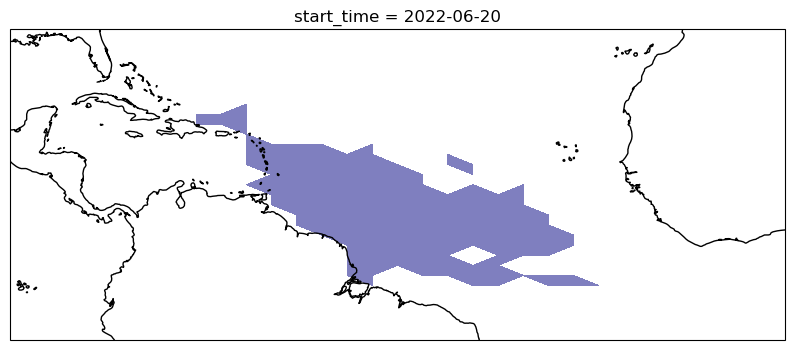

In [131]:
# for i in range(len(hist_5.start_time)):
for i in range(0,4): 
    
    dat = hist_5.isel(start_time=i).sum("obs")
    
    fig, ax = plt.subplots(1, 1, figsize=(10,20), subplot_kw=dict(projection=cartopy.crs.PlateCarree()))
    np.log10(dat).plot.contourf(
                    x="lon", y="lat",
                    transform=cartopy.crs.PlateCarree(), ax=ax,
                    add_colorbar=False,colors='#000080',alpha = 0.5, levels=[0,hist_5.max()]
                )
    ax.coastlines()

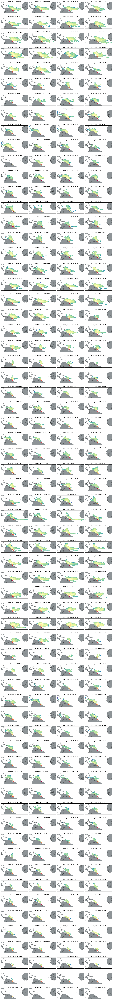

In [147]:
import math

da = hist_5.sum("obs")                 # (start_time, lon, lat)
dlog = da.where(da > 0).map_blocks(np.log10)

n = dlog.sizes["start_time"]           # 260
cols = 4
rows = math.ceil(n / cols)             # 65

# common color scale
vmin = float(np.nanmin(dlog.values))
vmax = float(np.nanmax(dlog.values))

fig, axes = plt.subplots(rows, cols, figsize=(4.0*cols, 2.8*rows),
                         subplot_kw=dict(projection=ccrs.PlateCarree()))
axes = np.asarray(axes).ravel()

fig.tight_layout(pad=0.1)
fig.subplots_adjust(wspace=0.3, hspace=-0.95)

for i in range(n):
    ax = axes[i]
    slc = dlog.isel(start_time=i)
    im = slc.plot.contourf(
        x="lon", y="lat", ax=ax, transform=ccrs.PlateCarree(),
        levels=20, vmin=vmin, vmax=vmax, cmap="Spectral_r", add_colorbar=False
    )
    # ax.set_title(np.datetime_as_string(slc.start_time.item(), unit='D'), fontsize=7)
    ax.coastlines(resolution='110m', linewidth=0.3)
    ax.set_xticks([]); ax.set_yticks([])
    ax.set_ylabel('')
    ax.set_xlabel('')
    ax.add_feature(cf.LAND, facecolor='#8e9497ff', zorder=0)
    ax.add_feature(cf.BORDERS, linewidth=0.3)

# remove any unused axes (none expected here)
for j in range(n, rows*cols):
    fig.delaxes(axes[j])

# shared colorbar
# cbar = fig.colorbar(im, ax=axes[:n], orientation='vertical',
#                     fraction=0.02, pad=0.01, aspect=40)
# cbar.set_label('log10(count)')
# plt.tight_layout()
# plt.savefig("Mesoescale.pdf")  # dpi not needed
plt.show()

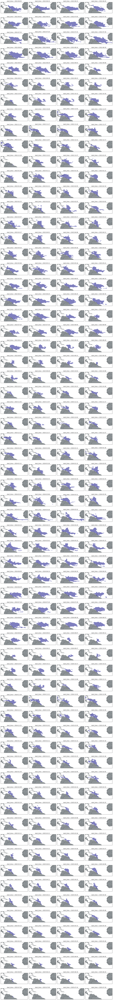

In [148]:
da = hist_5.sum("obs")                 # (start_time, lon, lat)
dlog = da.where(da > 0).map_blocks(np.log10)

n = dlog.sizes["start_time"]           # 260
cols = 4
rows = math.ceil(n / cols)             # 65

fig, axes = plt.subplots(rows, cols, figsize=(4.0*cols, 2.8*rows),
                         subplot_kw=dict(projection=ccrs.PlateCarree()))
axes = np.asarray(axes).ravel()

fig.tight_layout(pad=0.1)
fig.subplots_adjust(wspace=0.3, hspace=-0.95)

for i in range(n):
    ax = axes[i]
    slc = dlog.isel(start_time=i)
    im = slc.plot.contourf(
        x="lon", y="lat", ax=ax, transform=ccrs.PlateCarree(),
        colors='#000080',alpha = 0.5, levels=[0,hist_5.max()], add_colorbar=False
    )
    # ax.set_title(np.datetime_as_string(slc.start_time.item(), unit='D'), fontsize=7)
    ax.coastlines(resolution='110m', linewidth=0.3)
    ax.set_xticks([]); ax.set_yticks([])
    ax.set_ylabel('')
    ax.set_xlabel('')
    ax.add_feature(cf.LAND, facecolor='#8e9497ff', zorder=0)
    ax.add_feature(cf.BORDERS, linewidth=0.3)

# remove any unused axes (none expected here)
for j in range(n, rows*cols):
    fig.delaxes(axes[j])

# shared colorbar
# cbar = fig.colorbar(im, ax=axes[:n], orientation='vertical',
#                     fraction=0.02, pad=0.01, aspect=40)
# cbar.set_label('log10(count)')
plt.tight_layout()
# plt.savefig("Mesoescale.pdf")  # dpi not needed
plt.show()